<img src="https://raw.githubusercontent.com/ml-unison/regresion-logistica/master/imagenes/ml-unison.png" width="250">

# Maquinas de vectores de soporte

**Julio Waissman Vianova**

En esta libreta vamos a ver las diferencias entre los diferentes *kernels* así como el efecto del parámetro $C$ en la clasificación por máquinas de vectores de soporte. 


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
plt.style.use('ggplot')
%matplotlib inline


### 1. Generación de las bases de datos con las que vamos a probar


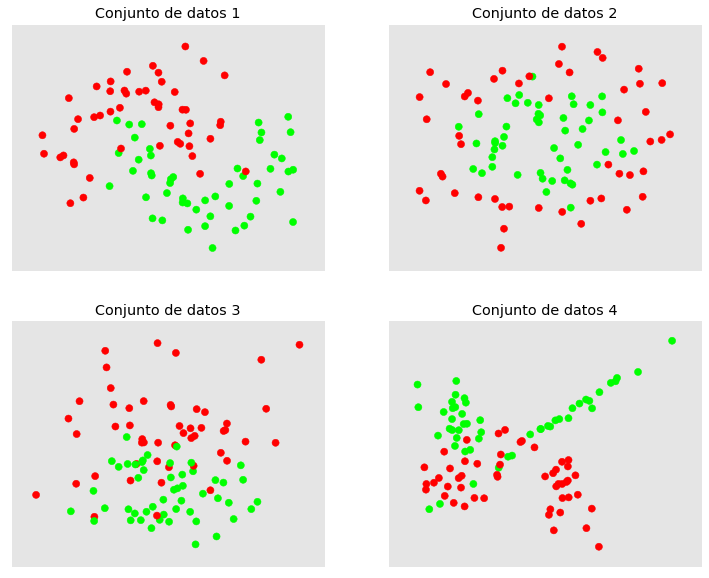

In [3]:
# Conjuntos de datos para probar
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from matplotlib.colors import ListedColormap

# Datos en forma de media luna
X1, y1 = datasets.make_moons(noise=0.3, random_state=0)

# Datos en forma de círculos
X2, y2 = datasets.make_circles(noise=0.2, factor=0.5, random_state=1)

# Datos en forma de regresion lineal
X3, y3 = datasets.make_classification(
    n_features=2, n_redundant=0, n_informative=2, n_clusters_per_class=1
)
# Le agregamos ruido para hacerlos interesantes
rng = np.random.RandomState(2)
X3 += 2 * rng.uniform(size=X3.shape)

X4, y4 = datasets.make_classification(
    n_features=2, n_redundant=0, n_informative=2, n_clusters_per_class=2
)

# Los conjuntos de datos irdenados como una lista de pares ordenados
datasets = [(X1, y1), (X2, y2), (X3, y3), (X4, y4)]

# Y los grafiacamos para verlos
figure = plt.figure(figsize=(10, 10))
cm_escala = ListedColormap(['#FF0000', '#0000FF', '#00FF00'])

for (i, ds) in enumerate(datasets):

    # Selecciona los valores del conjunto de datos y los escala
    X, y = ds
    X = StandardScaler().fit_transform(X)

    # Grafica
    ax = plt.subplot(2, 2, i+1)
    ax.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap=cm_escala)
    ax.set_xlim(X[:, 0].min() - .5, X[:, 0].max() + .5)
    ax.set_ylim(X[:, 1].min() - .5, X[:, 1].max() + .5)
    ax.set_xticks(())
    ax.set_yticks(())
    plt.title(f"Conjunto de datos {i+1}")
figure.subplots_adjust(left=.02, right=.98)    
plt.show()



### 2. Probando diferentes kernels en los conjuntos de datos





Base de datos 1


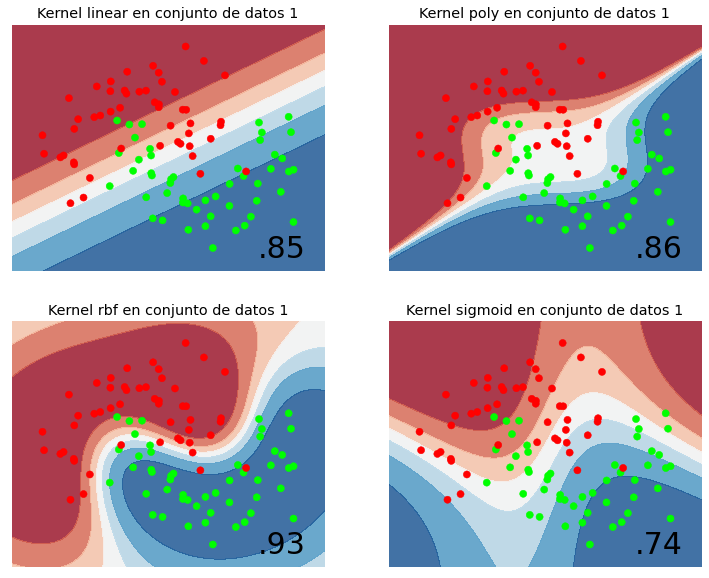



Base de datos 2


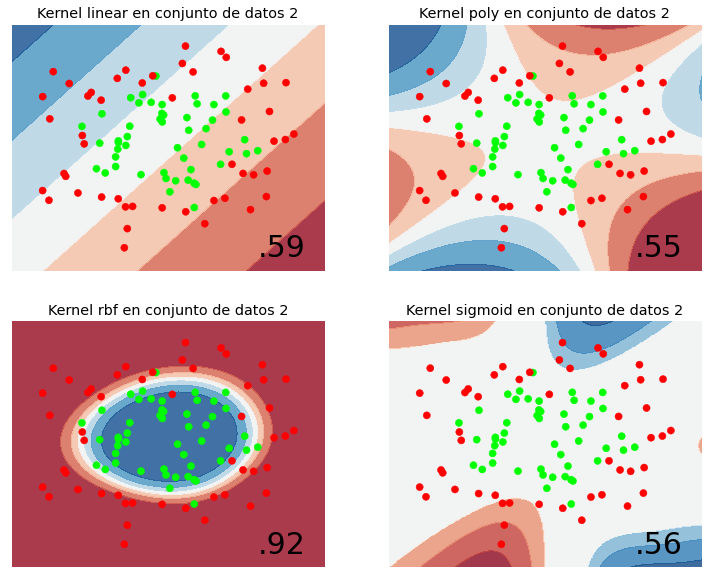



Base de datos 3


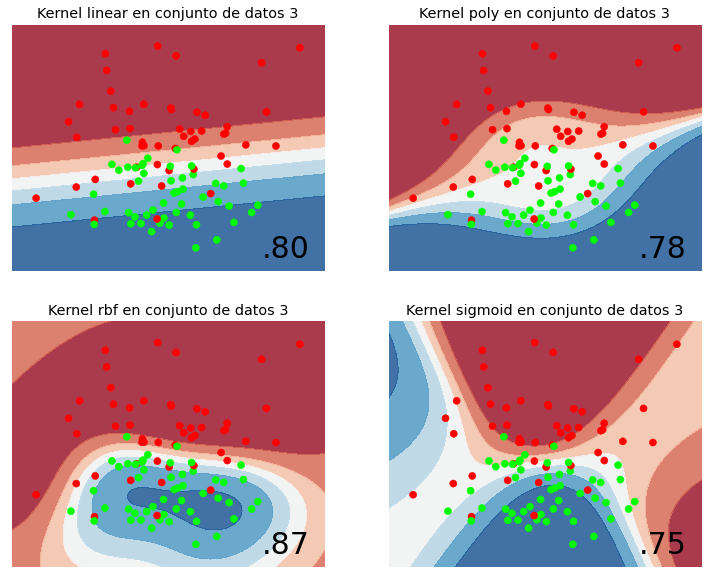



Base de datos 4


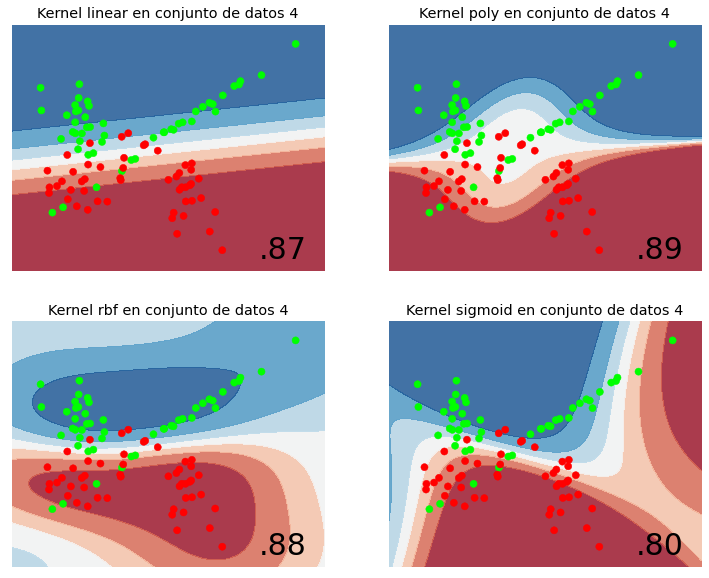

In [4]:
## Vamos a escoger una escala de colores de alto contraste
cm = plt.cm.RdBu

# Una figura por cada conjunto de datos
for (cual, ds) in enumerate(datasets):
    
    print(f"\n\nBase de datos {cual + 1}")
    figure = plt.figure(figsize=(10, 10))

    # Escalar y selecciona valores de entrenamiento y prueba
    X, y = ds
    X = StandardScaler().fit_transform(X)
 
    # Meshgrid para pintar las regiones
    xx, yy = np.meshgrid(np.arange(X[:, 0].min() - .5, X[:, 0].max() + .5, 0.02),
                         np.arange(X[:, 1].min() - .5, X[:, 1].max() + .5, 0.02))

    # Por cada clasificador
    for (i, kernel) in enumerate(['linear', 'poly', 'rbf', 'sigmoid']):
        ax = plt.subplot(2, 2, i + 1)

        # Entrenamiento
        clf = SVC(kernel=kernel, C=1, probability=True)
        clf.fit(X, y)
        score = clf.score(X, y)

        # Clasifica cada punto en el meshgrid
        Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
        Z = Z.reshape(xx.shape)

        # Asigna un contorno de probabilidad
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)
        # Grafica los datos
        ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cm_escala, s=50)
        # Arregla axes y pone titulos
        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=30, horizontalalignment='right')
        plt.title(f"Kernel {kernel} en conjunto de datos {cual + 1}")

    figure.subplots_adjust(left=.02, right=.98)
    plt.show()

### 3. Que pasa cuando aumenta $C$ en el clasificador lineal



Base de datos 1


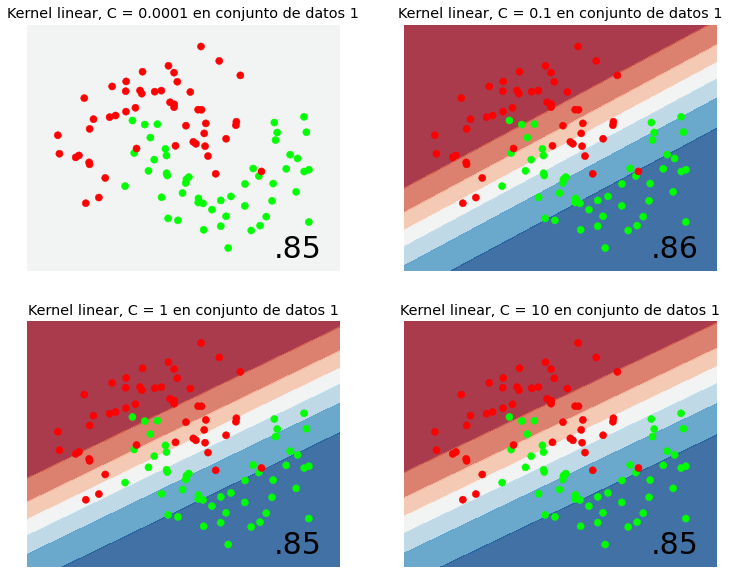



Base de datos 2


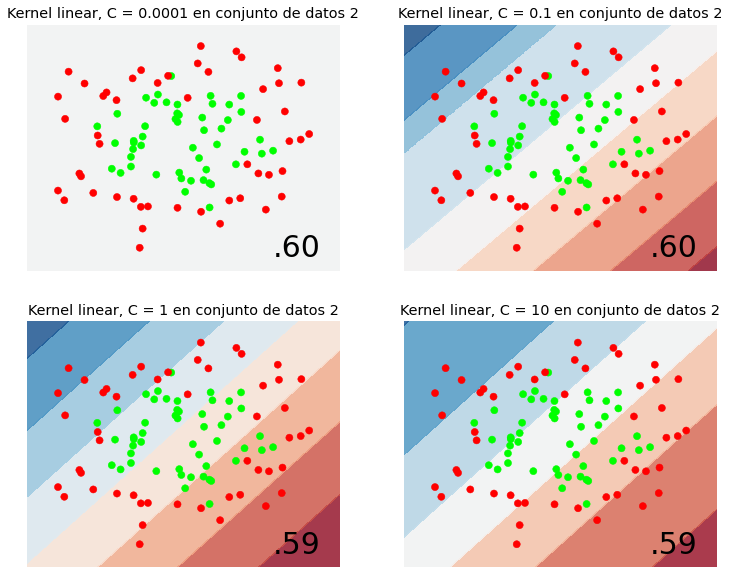



Base de datos 3


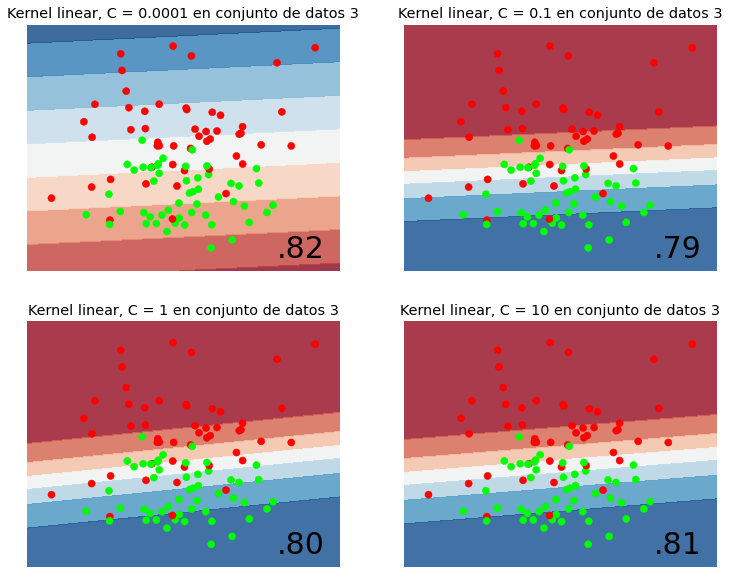



Base de datos 4


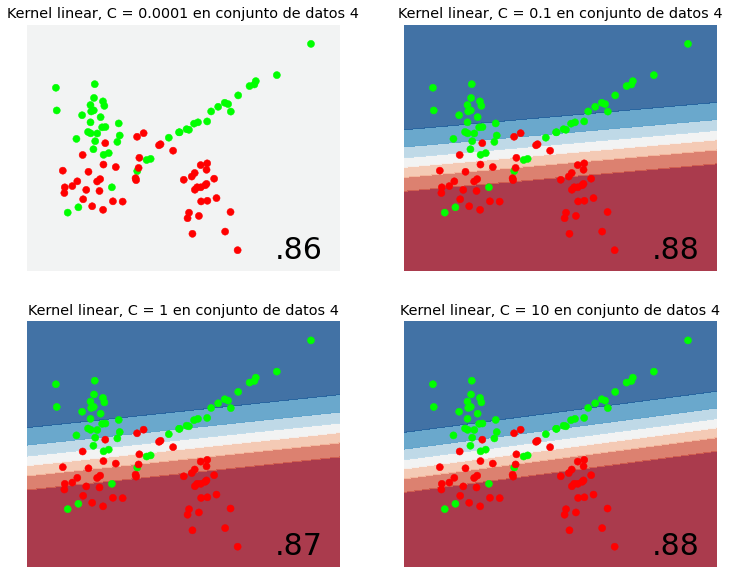

In [5]:
kernel = 'linear'

# Una figura por cada conjunto de datos
for (cual, ds) in enumerate(datasets):
    
    print(f"\n\nBase de datos {cual + 1}")
    figure = plt.figure(figsize=(10, 10))

    # Escalar y selecciona valores de entrenamiento y prueba
    X, y = ds
    X = StandardScaler().fit_transform(X)
 
    # Meshgrid para pintar las regiones
    xx, yy = np.meshgrid(np.arange(X[:, 0].min() - .5, X[:, 0].max() + .5, 0.02),
                         np.arange(X[:, 1].min() - .5, X[:, 1].max() + .5, 0.02))

    # Por cada clasificador
    for (i, C) in enumerate([.0001, .1, 1, 10]):
        ax = plt.subplot(2, 2, i + 1)

        # Entrenamiento
        clf = SVC(kernel=kernel, C=C, probability=True)
        clf.fit(X, y)
        score = clf.score(X, y)

        # Clasifica cada punto en el meshgrid
        Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
        Z = Z.reshape(xx.shape)

        # Asigna un contorno de probabilidad
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)
        # Grafica los datos
        ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cm_escala, s=50)
        # Arregla axes y pone titulos
        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=30, horizontalalignment='right')
        plt.title(f"Kernel {kernel}, C = {C} en conjunto de datos {cual + 1}")

    figure.subplots_adjust(left=.02, right=.98)
    plt.show()

**Ejercicio 1. Prueba modificar los valores de C para los diferentes kernels manteniendo el resto de los parámetros por default. Comenta aquí mismo tus conclusiones.**

El paramétro $C$ está relacionado con la regularización ya que la fuerza de la regularización es inversamente proporcional este valor.
Esto quiere decir que para valores pequeños como 0.001 el modelo está generalizando (en un caso con 0.0001 generalizaba tanto que no se ven las regiones).
En la mayoría de los casos cuánto más grande es $C$ mejor es la clasificación, pero esto no sucedió con la base de datos 2, donde empeoró su desempeño, pero también se considera que estamos usando un kernel lineal para separar los datos.


### 4. La variable `gamma` para los kernel `rbf`, `poly` y `sigmoid`

** Ejercicio 2. Escribe aquí mismo que significa la variable `gamma` ($\gamma$) ** para los diferentes kernels (puedes poner la ecuación si es necesario)

Según la documentación de `scikit learn`, `gamma` se define intuitivamente como qué tantó se extiende la influencia de un solo dato de entrenamiento.

1. Para `rbf`: $\gamma = \frac{1}{2\sigma^2}$

Con valores bajos se define como una influencia lejana (los puntos lejanos tienen influencia sobre el margen de clasificación), para valores grandes como una influencia corta (solo los valores cercanos al margen tendrán influencia).

2. Para `poly`:

Con valores bajos se define como una influencia lejana (los puntos lejanos tienen influencia sobre el margen de clasificación), para valores grandes como una influencia corta (solo los valores cercanos al margen tendrán influencia).

3. Para `sigmoid`:

Con valores bajos se define como una influencia lejana (los puntos lejanos tienen influencia sobre el margen de clasificación), para valores grandes como una influencia corta (solo los valores cercanos al margen tendrán influencia).




Base de datos 1


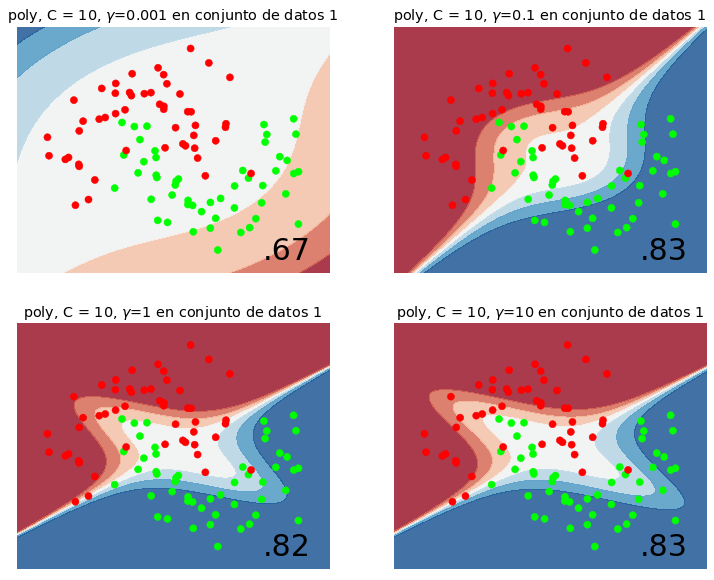



Base de datos 2


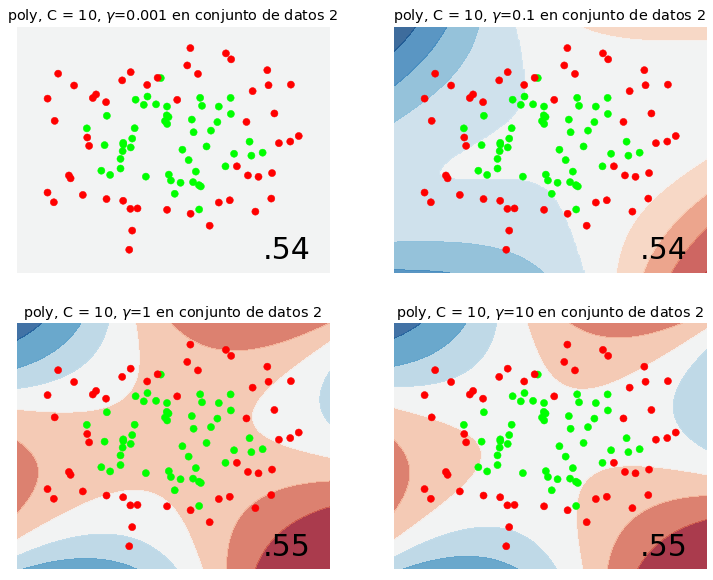



Base de datos 3


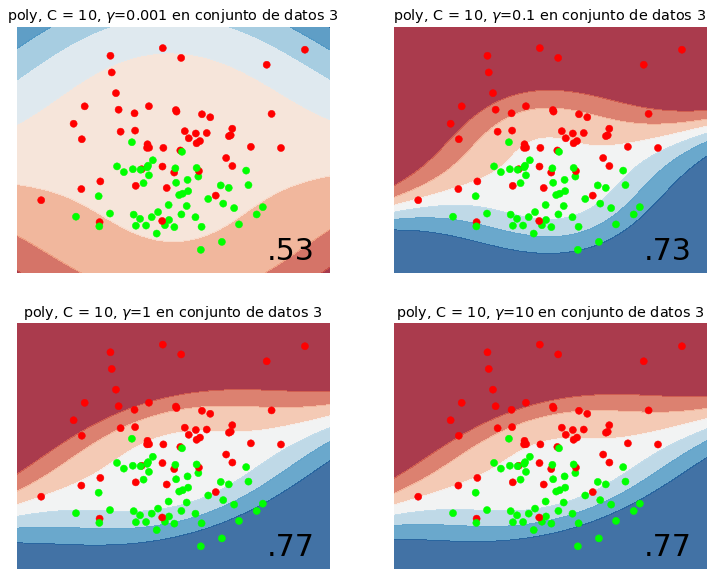



Base de datos 4


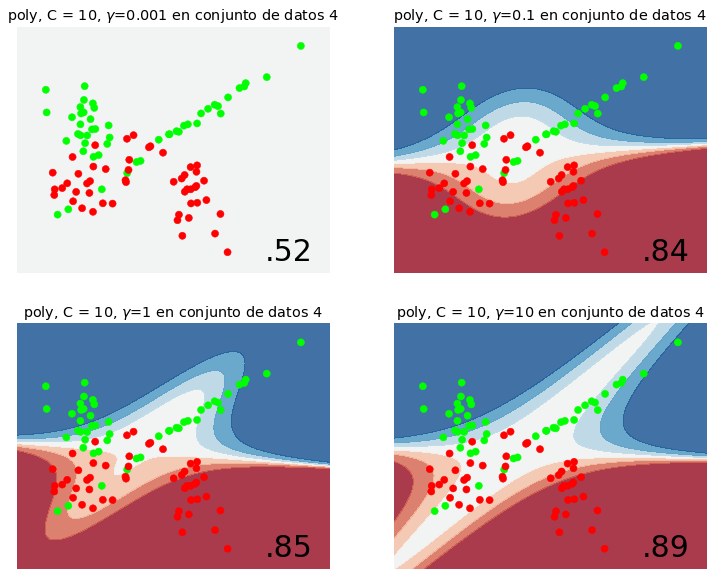

In [6]:
kernel = 'poly'
C = 10

# Una figura por cada conjunto de datos
for (cual, ds) in enumerate(datasets):
    
    print(f"\n\nBase de datos {cual + 1}")
    figure = plt.figure(figsize=(10, 10))

    # Escalar y selecciona valores de entrenamiento y prueba
    X, y = ds
    X = StandardScaler().fit_transform(X)
 
    # Meshgrid para pintar las regiones
    xx, yy = np.meshgrid(np.arange(X[:, 0].min() - .5, X[:, 0].max() + .5, 0.02),
                         np.arange(X[:, 1].min() - .5, X[:, 1].max() + .5, 0.02))

    # Por cada clasificador
    for (i, gamma) in enumerate([.001, .1, 1, 10]):
        ax = plt.subplot(2, 2, i + 1)

        # Entrenamiento
        clf = SVC(kernel=kernel, C=C, gamma=gamma, probability=True)
        clf.fit(X, y)
        score = clf.score(X, y)

        # Clasifica cada punto en el meshgrid
        Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
        Z = Z.reshape(xx.shape)

        # Asigna un contorno de probabilidad
        ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)
        # Grafica los datos
        ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cm_escala, s=50)
        # Arregla axes y pone titulos
        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=30, horizontalalignment='right')
        plt.title(f"{kernel}, C = {C}, $\gamma$={gamma} en conjunto de datos {cual + 1}")

    figure.subplots_adjust(left=.02, right=.98)
    plt.show()

**Ejercicio 3: Encuentra la mejor combiación de $C$ y $\gamma$ para los 3 tipos de *kernel*, explica en cada uno en que afecta la $\gamma$ y porque tiene una influencia tan diferente.**

- `'rbf'`: para este Kernel en general cuanto más grande sean $C$ y $\gamma$ obtiene un mejor score, pero tambien se observa que generaliza cada vez menos al aumentar estos valores, por lo que se sugiere un valor de $C = 1$ y $\gamma = 0.1$ 
- `'poly'`: en general a este kernel no le fue tan bien clasificando como al anterior, sobre todo en el segundo conjunto de datos, pero la combinación que parecía funcionar mejor es $C = 1$ y $\gamma = 1$ sin empezar a sobre ajustar   
- `'linear'`: a este kernel le fue mejor que al anterior, pero siguen existiendo deficiencias en el segundo dataset, pero el general cualquiera de los valores con los que se probó arrojó resultados similares, por lo que se optó por $C = 0.1$ y $\gamma = 0.1$ para asegurar más generalización.
- `'sigmoid'`: dado los resultados, optaría por $C = 0.1$ y $\gamma = 1$ ya que dan buenos scores pero no se complica demasiado la separación de los datos.

**Ejercicio 4: Como viste, existe mucho código repetido en los incisos 2, 3 y 4, por lo que se puede generalizar una parte con una función. Intenta generalizarlo** 



Base de datos 1


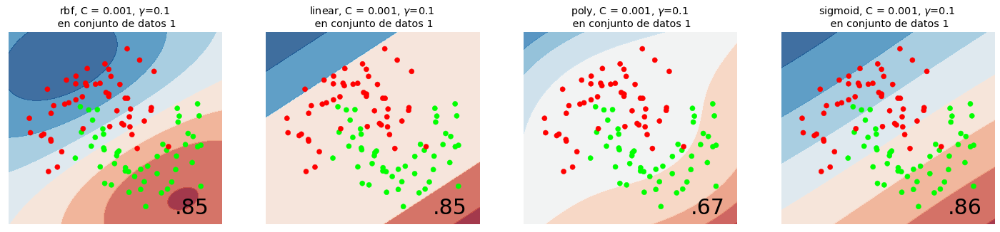



Base de datos 2


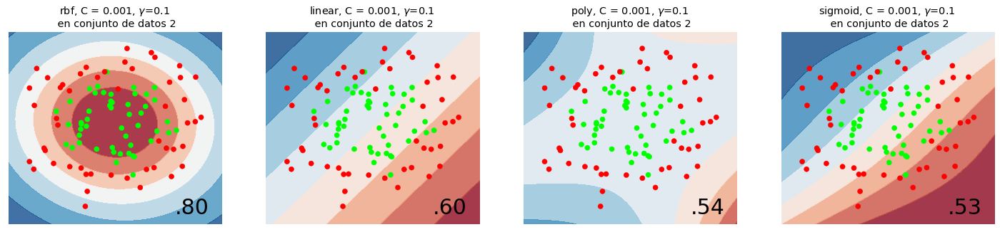



Base de datos 3


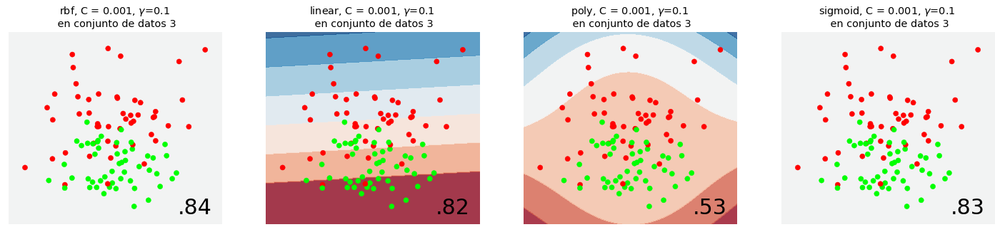



Base de datos 4


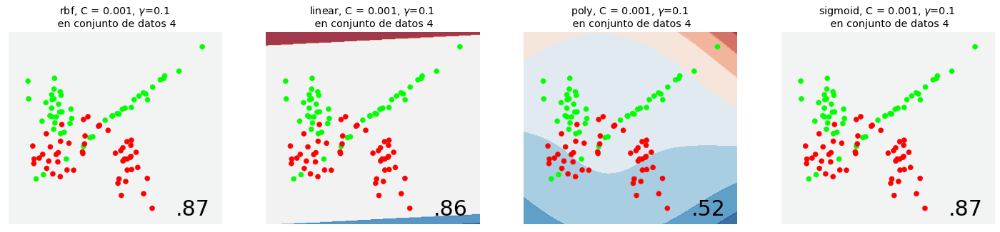

In [7]:

def prueba_svm(datasets, Kernel, C, Gamma):
    """
    Función que compara el desempeño de máquinas de vector de soporte con 
    distintos kernels, C y gammas, esta función grafica los resultados con 
    cada modelo entrenado con distitos parámetros


    @param datasets: datasets donde probar el rendimiento de las svm.
    @param Kernel: Lista de distintos kernels para probar su desempeño 
                    ('rbf', 'poly', 'linear', 'sigmoid')
    @param C: Lista de distintos valores de C a probar
    @param Gamma: Lista de distintos valores de gamma a probar
    """

    # Una figura por cada conjunto de datos
    for (cual, ds) in enumerate(datasets):

        #figure = plt.figure(figsize=(5 * len(Kernel), 5))
        print(f"\n\nBase de datos {cual + 1}")

        # Escalar y selecciona valores de entrenamiento y prueba
        X, y = ds
        X = StandardScaler().fit_transform(X)
    
        # Meshgrid para pintar las regiones
        xx, yy = np.meshgrid(np.arange(X[:, 0].min() - .5, X[:, 0].max() + .5, 0.02),
                            np.arange(X[:, 1].min() - .5, X[:, 1].max() + .5, 0.02))

        for (i, gamma) in enumerate(Gamma):
            for (j, c) in enumerate(C):
                figure = plt.figure(figsize=(5 * len(Kernel), 5))
                for (k, kernel) in enumerate(Kernel):

                    ax = plt.subplot(1, len(Kernel), k + 1)

                    # Entrenamiento
                    clf = SVC(kernel=kernel, C=c, gamma=gamma, probability=True)
                    #print(f"Entrenando con kernel = {kernel} con una C = {c} y una gamma = {gamma}")
                    clf.fit(X, y)
                    score = clf.score(X, y)

                    # Clasifica cada punto en el meshgrid
                    Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
                    Z = Z.reshape(xx.shape)

                    # Asigna un contorno de probabilidad
                    ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)
                    # Grafica los datos
                    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cm_escala, s=50)
                    # Arregla axes y pone titulos
                    ax.set_xlim(xx.min(), xx.max())
                    ax.set_ylim(yy.min(), yy.max())
                    ax.set_xticks(())
                    ax.set_yticks(())
                    ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                            size=30, horizontalalignment='right')
                    plt.title(f"{kernel}, C = {c}, $\gamma$={gamma} \n en conjunto de datos {cual + 1}")

                    figure.subplots_adjust(left=.02, right=.98)
                plt.show()
                #figure = plt.figure(figsize=(5 * len(Kernel), 5))


prueba_svm(datasets, ['rbf', 'linear', 'poly','sigmoid'], [0.001], [0.1])

**Exta bono: ¿Que significa el parámetro `coef0` para los *kernels* `sigmoid` y `poly`? ¿Cómo afeca en la clasificación?

Según la documentación de `scikit learn`, `coef0` es el término independiente de la función de kernel. Para los kernels vemos que:
- sigmoid = $(\gamma \langle x, x'\rangle +  r)$
- polynomial = $(\gamma\langle x, x' \rangle + r)^d$

donde $r$ está especificado por `coef0`.

Hubo algunos casos donde parece ayudar a la clasificación, como con el conjunto de datos 1, sigmoid $C = 1$, $\gamma = 1$, donde con `coef0` = 0 tiene un score de 0.58 y con `coef0` = 5 uno de 0.83, una diferencia importante. Pero en otros casos empeoró considerablemente, como en el conjunto de datos 2, sigmoid $C = 0.1$, $\gamma = 1$, donde con `coef0` = 0 tiene un score de 0.61 y con `coef0` = 5 uno de 0.12.



Base de datos 1


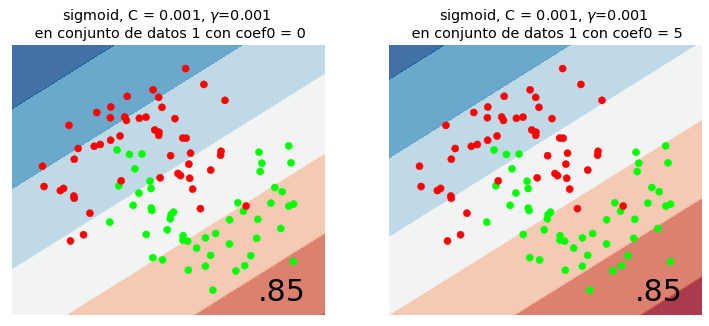



Base de datos 2


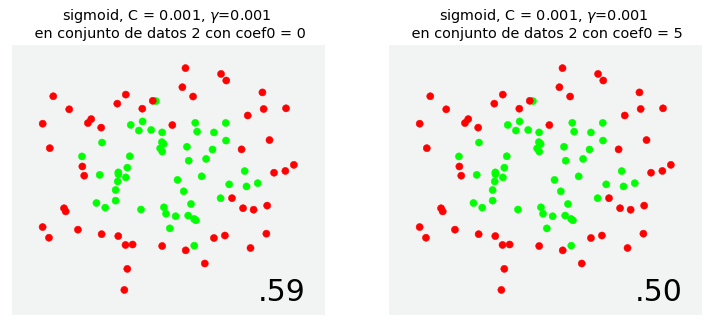



Base de datos 3


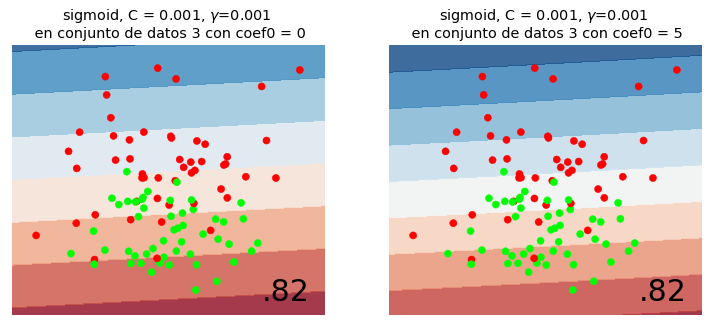



Base de datos 4


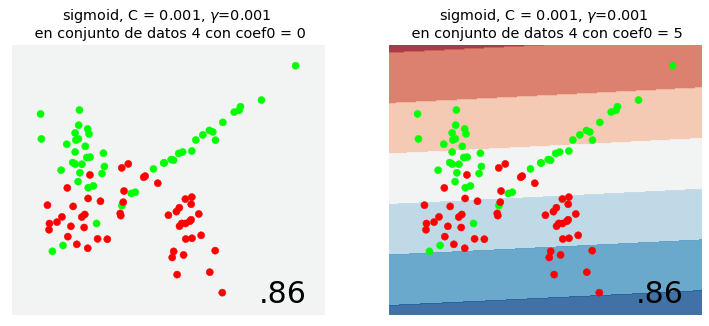

In [9]:
def prueba_svm_coef0(kernel, C, Gamma, Coef0):
    """
    Función que compara el desempeño de máquinas de vector de soporte con 
    distintos kernels, C y gammas, esta función grafica los resultados con 
    cada modelo entrenado con distitos parámetros


    @param Kernel: Kernel a utilizar en la svm
    @param C: Lista de distintos valores de C a probar
    @param Gamma: Lista de distintos valores de gamma a probar
    @param Coef0: Valores para el parámetro coef0 a probar.
    """

    # Una figura por cada conjunto de datos
    for (cual, ds) in enumerate(datasets):

        #figure = plt.figure(figsize=(5 * len(Kernel), 5))
        print(f"\n\nBase de datos {cual + 1}")

        # Escalar y selecciona valores de entrenamiento y prueba
        X, y = ds
        X = StandardScaler().fit_transform(X)
    
        # Meshgrid para pintar las regiones
        xx, yy = np.meshgrid(np.arange(X[:, 0].min() - .5, X[:, 0].max() + .5, 0.02),
                            np.arange(X[:, 1].min() - .5, X[:, 1].max() + .5, 0.02))

        for (i, gamma) in enumerate(Gamma):
            for (j, c) in enumerate(C):
                figure = plt.figure(figsize=(5 * len(Coef0), 5))
                for (k, coef0) in enumerate(Coef0):

                    ax = plt.subplot(1, len(Coef0), k + 1)

                    # Entrenamiento
                    clf = SVC(kernel=kernel, C=c, gamma=gamma, probability=True, coef0=coef0)
                    #print(f"Entrenando con kernel = {kernel} con una C = {c} y una gamma = {gamma}")
                    clf.fit(X, y)
                    score = clf.score(X, y)

                    # Clasifica cada punto en el meshgrid
                    Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
                    Z = Z.reshape(xx.shape)

                    # Asigna un contorno de probabilidad
                    ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)
                    # Grafica los datos
                    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cm_escala, s=50)
                    # Arregla axes y pone titulos
                    ax.set_xlim(xx.min(), xx.max())
                    ax.set_ylim(yy.min(), yy.max())
                    ax.set_xticks(())
                    ax.set_yticks(())
                    ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                            size=30, horizontalalignment='right')
                    plt.title(f"{kernel}, C = {c}, $\gamma$={gamma} \n en conjunto de datos {cual + 1} con coef0 = {coef0}")

                    figure.subplots_adjust(left=.02, right=.98)
                plt.show()
                #figure = plt.figure(figsize=(5 * len(Coef0), 5))
prueba_svm_coef0('sigmoid', [0.001], [0.001], [0, 5])